In [1]:
from astropy.io import fits
import matplotlib.pyplot as plt
import aplpy
import matplotlib.pyplot as plt
import pyregion
from tqdm import tqdm
from astropy.table import QTable
import warnings
import numpy as np
import imageio.v3 as iio
from reproject import reproject_interp
import astropy.units as u

from astropy.wcs import WCS
import matplotlib as mpl
from matplotlib.colors import ListedColormap, LogNorm, Normalize, PowerNorm
from astropy.coordinates import SkyCoord
import colorcet
import cv2
from glob import glob

warnings.filterwarnings("ignore")
plt.style.use('paper')

In [2]:
input_dir = '/Users/abarnes/Dropbox/work/Smallprojects/galaxies/scratch/jwst_pressreleaseimages/'
output_dir = '/Users/abarnes/Dropbox/work/Smallprojects/galaxies/scratch/jwst_pressreleaseimages/check_plots/'

input_files1 = glob(f'{input_dir}/jwst_northUp/*.png')
gals = [input_file1.split('/')[-1].split('_')[0] for input_file1 in input_files1]
# gals = ['ic5332']

libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


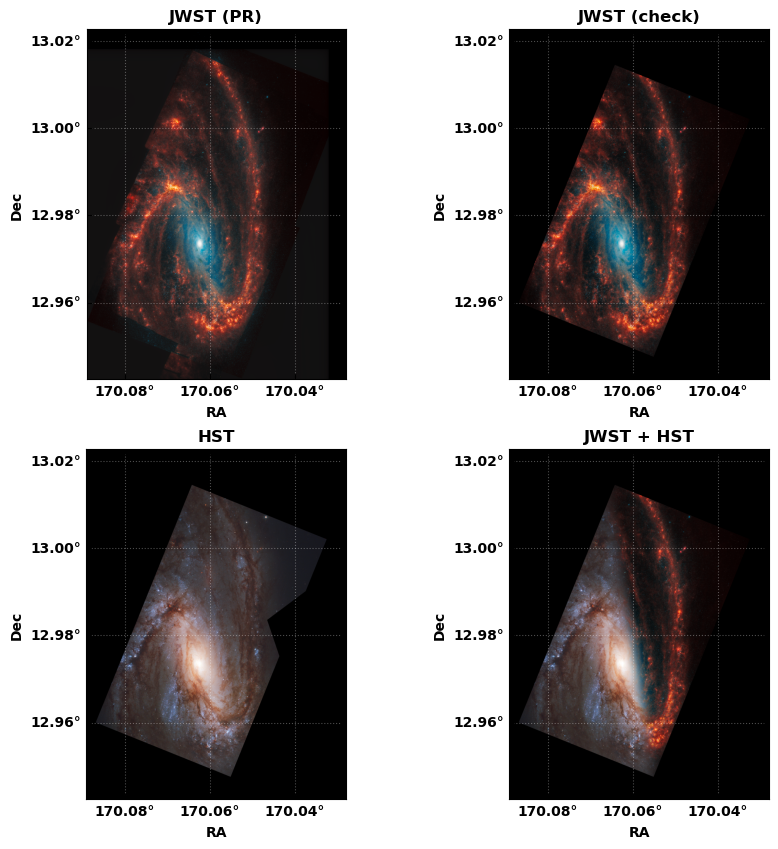

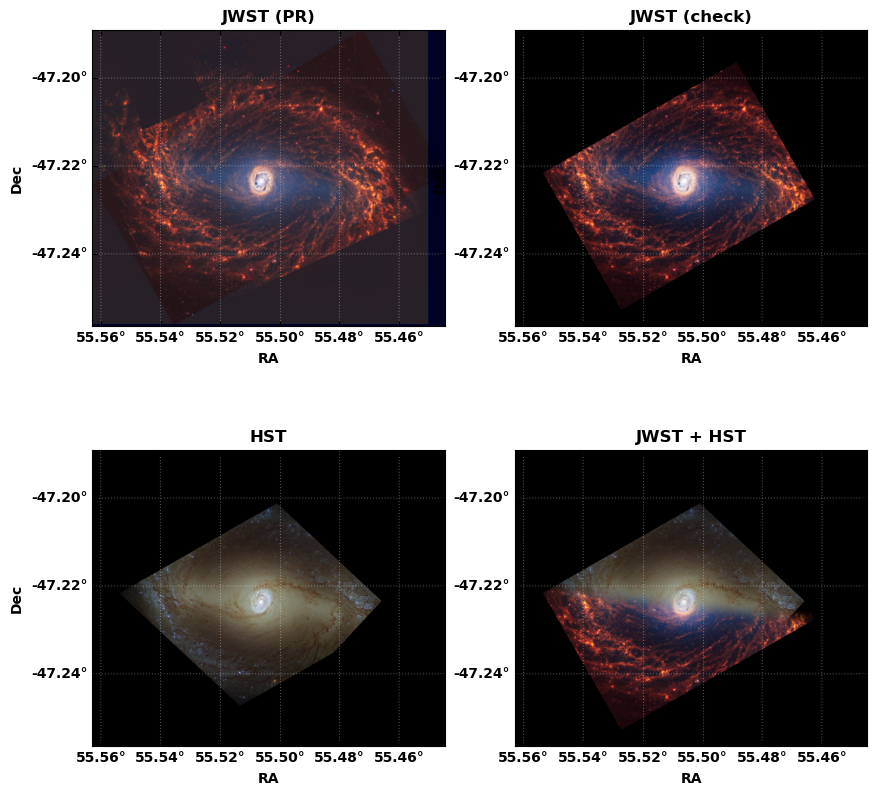

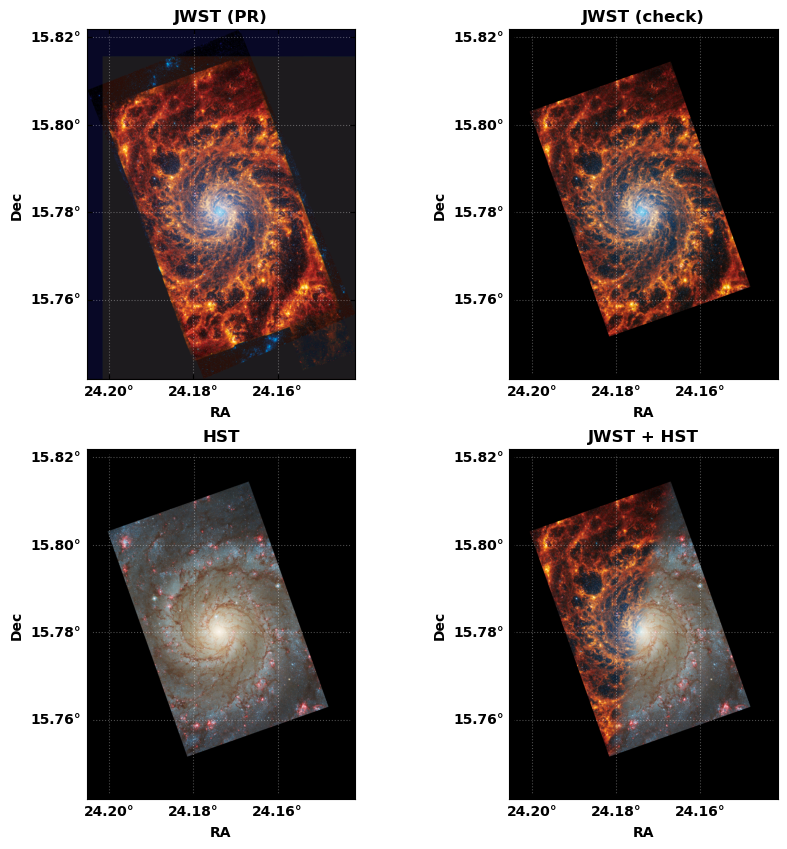

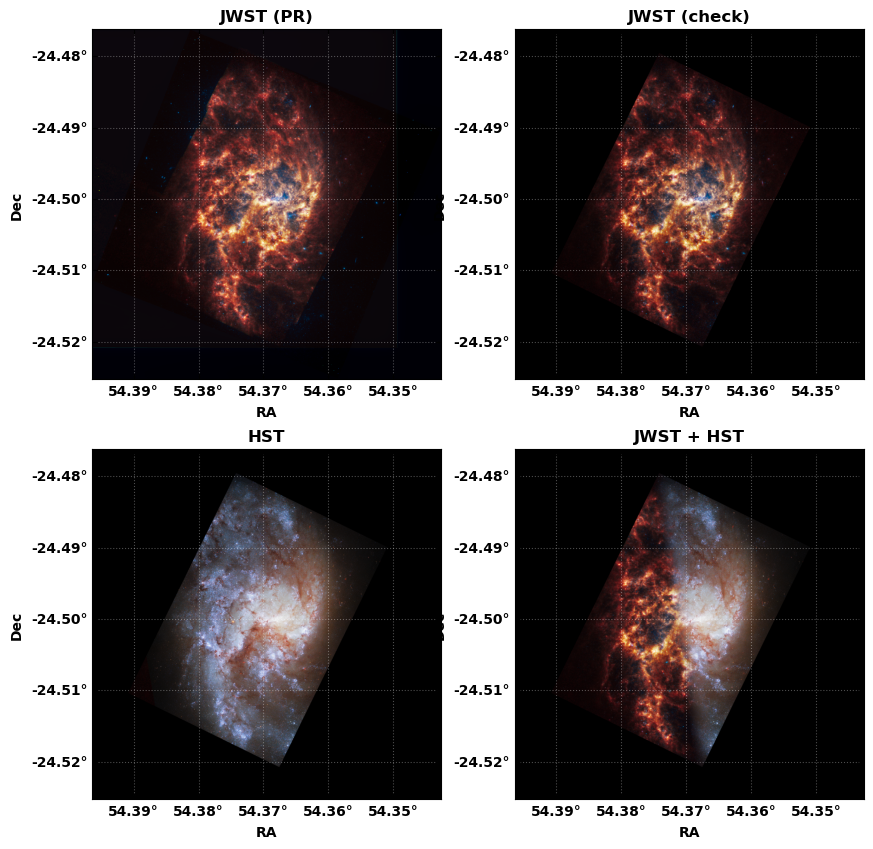

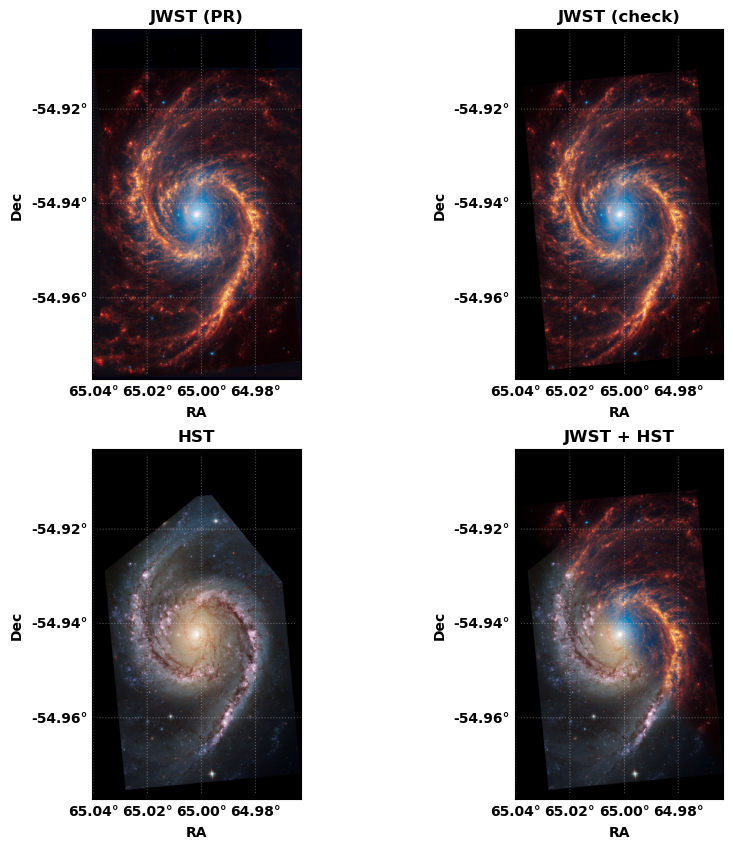

...

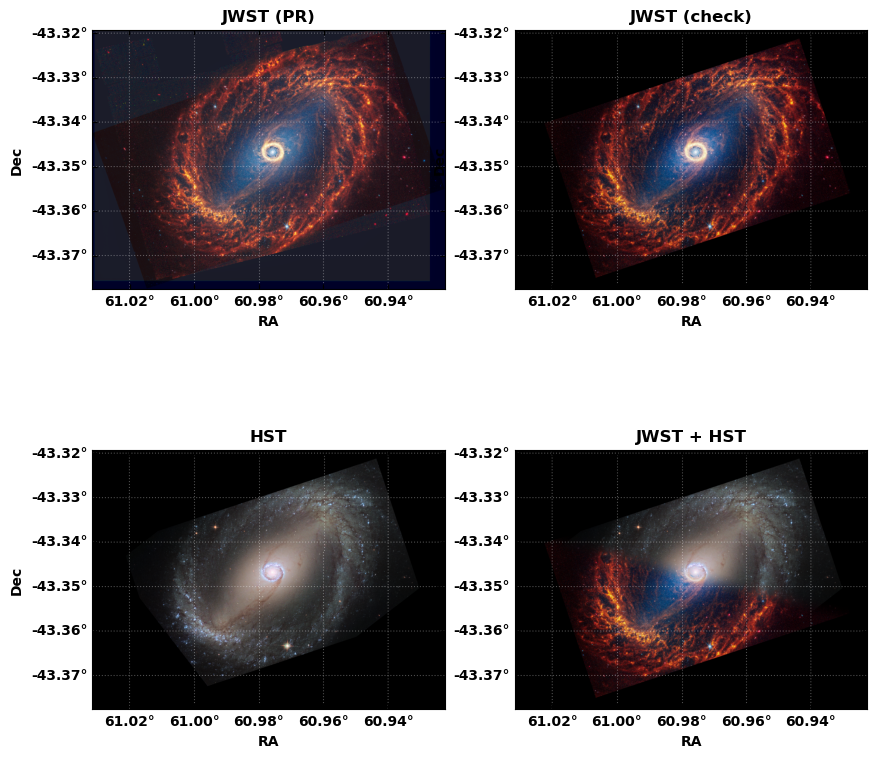

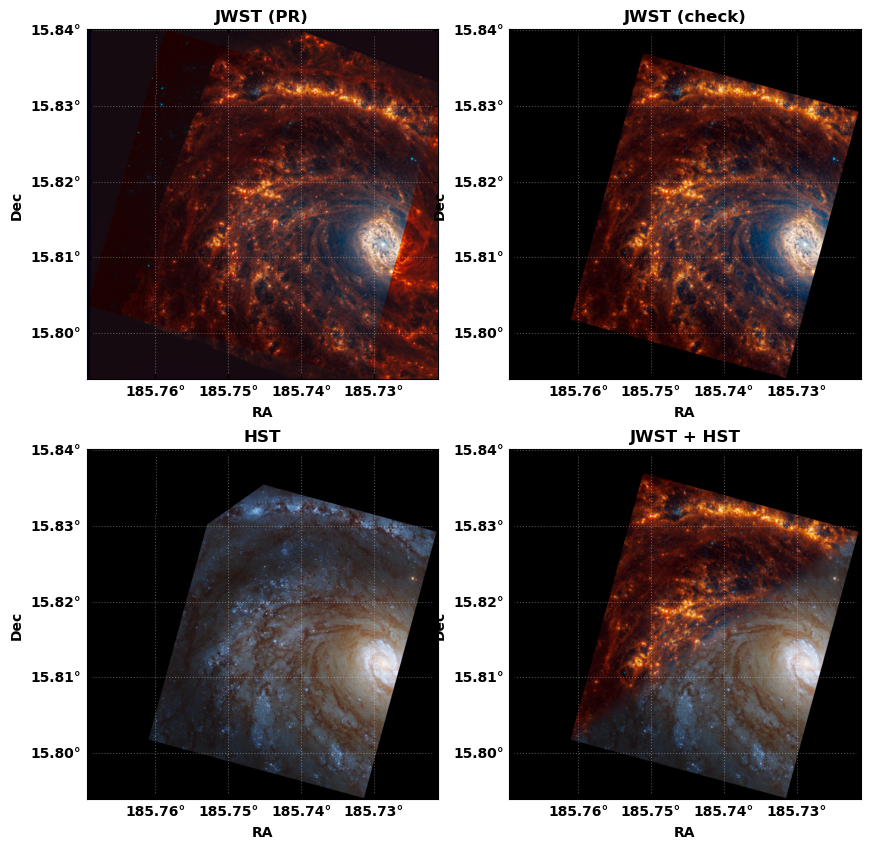

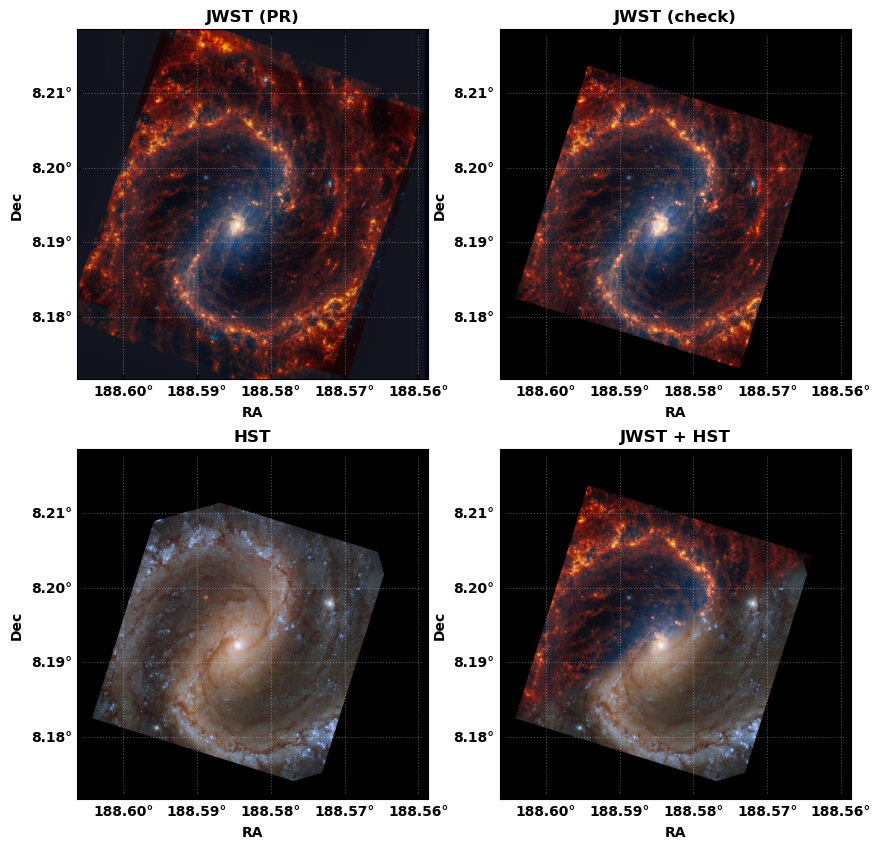

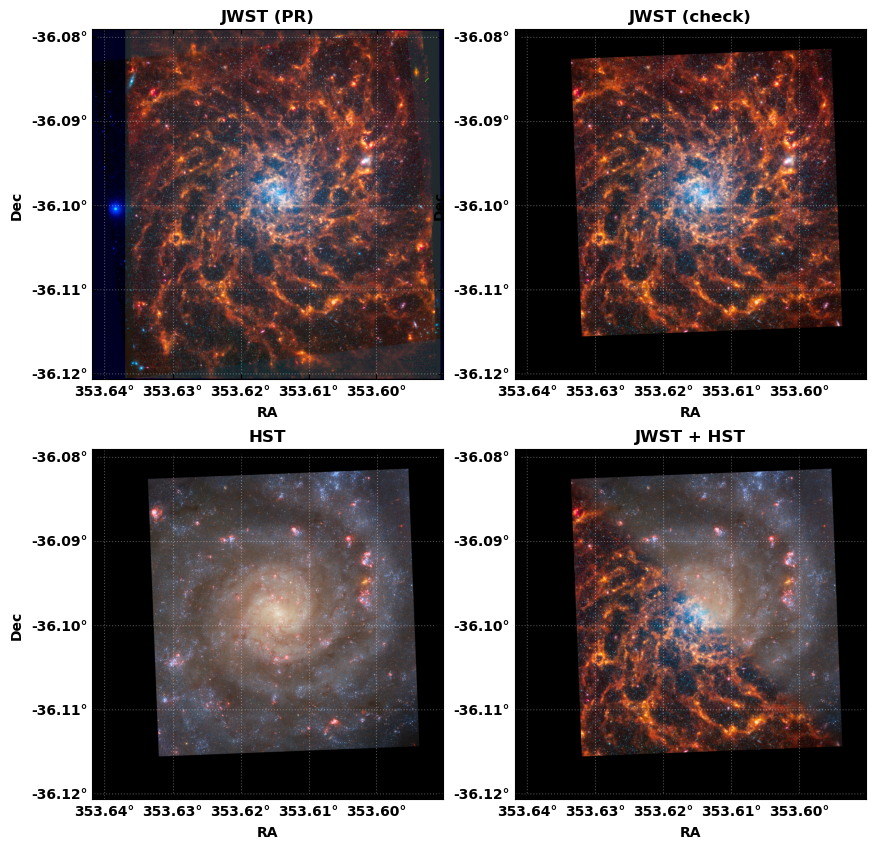

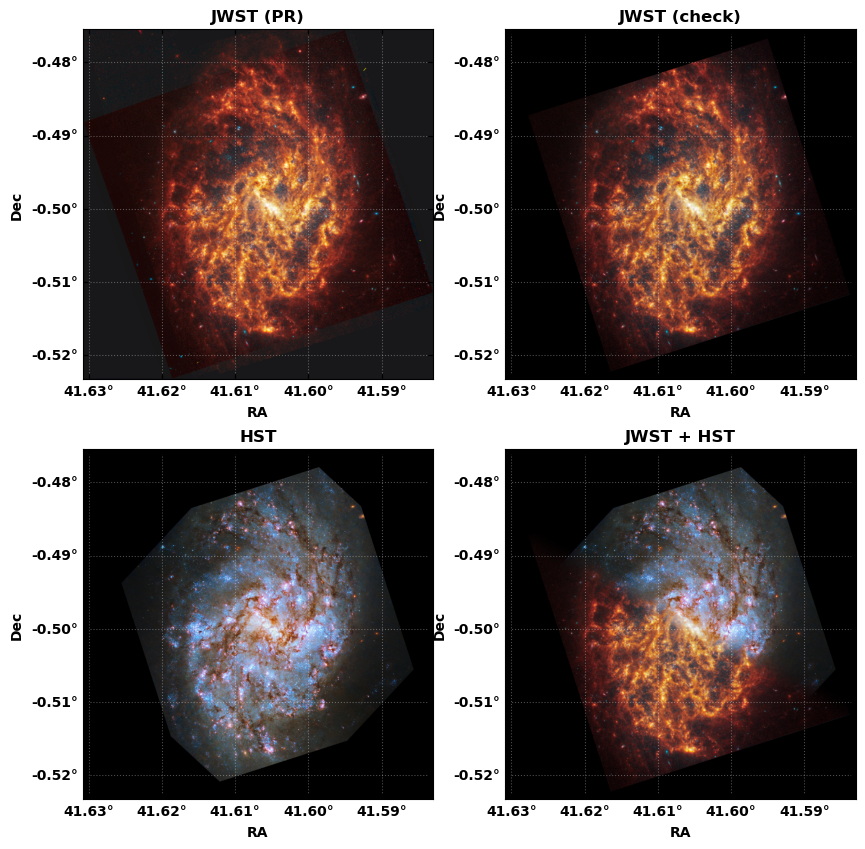

In [3]:
for gal in gals:

    hdu = fits.open(f'{input_dir}/jwst_wcs/{gal}_nircam_lv3_f335m_i2d.fits')[1]
    img1 = cv2.imread(f'{input_dir}/jwst_northUp/{gal}_northUp.png', cv2.IMREAD_UNCHANGED)[:, :, ::-1]
    img2 = cv2.imread(f'{input_dir}/jwst_northUp_check/{gal}_jwst_northUp.png', cv2.IMREAD_UNCHANGED)[:, :, ::-1]
    img3 = cv2.imread(f'{input_dir}/hst_northUp/{gal}_hst_northUp.png', cv2.IMREAD_UNCHANGED)[:, :, ::-1]
    img4 = cv2.imread(f'{input_dir}/jwsthst_northUp/{gal}_jwsthst_northUp.png', cv2.IMREAD_UNCHANGED)[:, :, ::-1]

    fig = plt.figure(figsize=(10, 10))

    ax1 = fig.add_subplot(221, projection=WCS(hdu.header))
    ax2 = fig.add_subplot(222, projection=WCS(hdu.header))
    ax3 = fig.add_subplot(223, projection=WCS(hdu.header))
    ax4 = fig.add_subplot(224, projection=WCS(hdu.header))

    ax1.imshow(img1, origin='lower')
    ax2.imshow(img2, origin='lower')
    ax3.imshow(img3, origin='lower')
    ax4.imshow(img4, origin='lower')

    ax1.set_title('JWST (PR)', weight='bold')
    ax2.set_title('JWST (check)', weight='bold')
    ax3.set_title('HST', weight='bold')
    ax4.set_title('JWST + HST', weight='bold')

    for ax in [ax1, ax2, ax3, ax4]:
        ax.set_xlabel('RA')
        ax.set_ylabel('Dec')
        ax.grid(True, alpha=0.3, ls=':', color='white')

        ra = ax.coords['ra']
        dec = ax.coords['dec']

        ra.set_major_formatter('d.dd')
        dec.set_major_formatter('d.dd')

    fig.savefig(f'{output_dir}/{gal}_comparison.png', dpi=300)